<a href="https://colab.research.google.com/github/minhluu2000/fugaku-workshop/blob/main/classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
%matplotlib inline

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# License: BSD
# Author: Sasank Chilamkurthy

# Modified for "EU-ASEAN HPC school 2022"

# ======================
# Import Libs
# ======================

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.nn.init as init
import torch.optim as optim
from torch.optim import lr_scheduler
import numpy as np
import torchvision
from torchvision import datasets, models, transforms
import matplotlib.pyplot as plt
import time
import os
import copy
import cv2

In [ ]:
import gdown
import zipfile

url = "https://drive.google.com/uc?export=download&confirm=pbef&id=1Y_KXraAlpYxTn8RLw30Ew5SddtzKgdMd"
output = "/content/drive/My Drive/Colab/EU_ASEAN_HPC22/classification/abcd.zip" # <= change path where you save data
gdown.download(url, output, quiet=False)

Downloading...
From: https://drive.google.com/uc?export=download&confirm=pbef&id=1Y_KXraAlpYxTn8RLw30Ew5SddtzKgdMd
To: /content/drive/My Drive/Colab/EU_ASEAN_HPC22/classification/abcd.zip
100%|██████████| 335M/335M [00:01<00:00, 228MB/s]


'/content/drive/My Drive/Colab/EU_ASEAN_HPC22/classification/abcd.zip'

In [ ]:
!unzip -q "/content/drive/My Drive/Colab/EU_ASEAN_HPC22/classification/abcd.zip" -d "/content/drive/My Drive/Colab/EU_ASEAN_HPC22/classification/" # <= change path where you save data

In [ ]:
# ======================
# Dataset
# ======================

# Data augmentation and normalization for training
# Just normalization for validation
data_transforms = {
    'train': transforms.Compose([
        transforms.Resize(224),
        transforms.RandomHorizontalFlip(),
        transforms.RandomVerticalFlip(),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    'val': transforms.Compose([
        transforms.Resize(224),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
}

data_dir = '/content/drive/My Drive/Colab/EU_ASEAN_HPC22/classification/abcd'
image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x),
                                          data_transforms[x])
                  for x in ['train', 'val']}
dataloaders = {x: torch.utils.data.DataLoader(image_datasets[x], batch_size=64,
                                             shuffle=True, num_workers=2)
              for x in ['train', 'val']}
dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'val']}
class_names = image_datasets['train'].classes

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

print(class_names)

['surviving', 'washed-away']


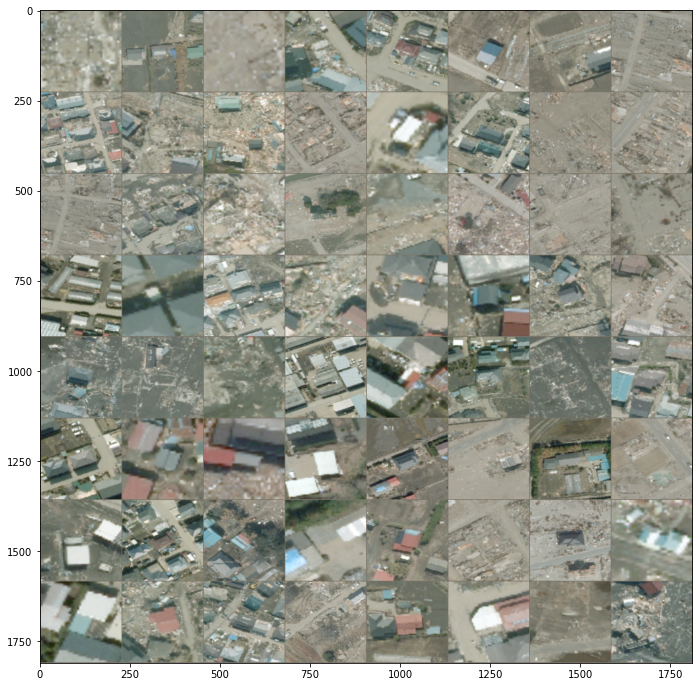

tensor([1, 0, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1,
        0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1])


In [ ]:
# ======================
# Show image
# ======================

def imshow(inp, title=None, figsize=6):
    """Imshow for Tensor."""
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.figure(figsize=(figsize,figsize))
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)  # pause a bit so that plots are updated


# Get a batch of training data
inputs, classes = next(iter(dataloaders['train']))

# Make a grid from batch
out = torchvision.utils.make_grid(inputs)

imshow(out,figsize=12)

print(classes)

In [ ]:
# ======================
# Function for training a model
# ======================

def train_model(model, criterion, optimizer, dataloaders, scheduler, num_epochs=25):
    since = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    train_accs = []
    val_accs = []

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch, num_epochs - 1))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0

            # Iterate over data.
            for inputs, labels in dataloaders[phase]:
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels)
                
            if phase == 'train':
                scheduler.step()

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]

            if phase == 'train':
                train_accs.append(epoch_acc)
            else:
                val_accs.append(epoch_acc)

            print('{} Loss: {:.4f} Acc: {:.4f}'.format(
                phase, epoch_loss, epoch_acc))

            # deep copy the model
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())

        print()

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}'.format(best_acc))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model

In [ ]:
# ======================
# Function for visualizing results
# ======================

def visualize_model(model, num_images=6, figsize=6, dog=None):
    was_training = model.training
    model.eval()
    images_so_far = 0
    #plt.figure(figsize=(figsize,figsize))
    fig = plt.figure()
    if dog:
        cls_idx = class_names.index(dog)
    else:
        cls_idx = -1

    with torch.no_grad():
        for i, (inputs, labels) in enumerate(dataloaders['val']):
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            for j in range(inputs.size()[0]):
                if cls_idx == -1 or labels[j] == cls_idx:
                    images_so_far += 1
                    ax = plt.subplot(num_images//2, 2, images_so_far)
                    ax.axis('off')
                    # modified
                    gt = [k for k, v in image_datasets['train'].class_to_idx.items() if v == labels[j]]
                    # modified
                    ax.set_title('predicted: {}'.format(class_names[preds[j]])+' -- gt: '+gt[0])
                    imshow(inputs.cpu().data[j],figsize=figsize)

                    if images_so_far == num_images:
                        model.train(mode=was_training)
                        return
        model.train(mode=was_training)

In [ ]:
# ======================
# Model set up
# ======================

# ResNet18
#net = models.resnet18(weights=None)
#num_ftrs = net.fc.in_features
#net.fc = nn.Linear(num_ftrs, len(class_names))
#net.to(device)

# VGG16
net = models.vgg16_bn(weights=None)
net.classifier[6] = nn.Linear(in_features=4096, out_features=len(class_names))
net = net.to(device)

criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(net.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 50 epochs
exp_lr_scheduler = lr_scheduler.StepLR(optimizer, step_size=50, gamma=0.1)

In [ ]:
from torchsummary import summary

summary(net,(3,224,224)) # summary(model,(channels,H,W))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 224, 224]           1,792
       BatchNorm2d-2         [-1, 64, 224, 224]             128
              ReLU-3         [-1, 64, 224, 224]               0
            Conv2d-4         [-1, 64, 224, 224]          36,928
       BatchNorm2d-5         [-1, 64, 224, 224]             128
              ReLU-6         [-1, 64, 224, 224]               0
         MaxPool2d-7         [-1, 64, 112, 112]               0
            Conv2d-8        [-1, 128, 112, 112]          73,856
       BatchNorm2d-9        [-1, 128, 112, 112]             256
             ReLU-10        [-1, 128, 112, 112]               0
           Conv2d-11        [-1, 128, 112, 112]         147,584
      BatchNorm2d-12        [-1, 128, 112, 112]             256
             ReLU-13        [-1, 128, 112, 112]               0
        MaxPool2d-14          [-1, 128,

In [ ]:
# ======================
# Traning
# ======================

net = train_model(net, criterion, optimizer, dataloaders, exp_lr_scheduler, num_epochs=10)

Epoch 0/9
----------
train Loss: 0.1454 Acc: 0.9493
val Loss: 0.1818 Acc: 0.9352

Epoch 1/9
----------
train Loss: 0.1307 Acc: 0.9533
val Loss: 0.1893 Acc: 0.9359

Epoch 2/9
----------
train Loss: 0.1293 Acc: 0.9499
val Loss: 0.1846 Acc: 0.9359

Epoch 3/9
----------
train Loss: 0.1315 Acc: 0.9528
val Loss: 0.1599 Acc: 0.9440

Epoch 4/9
----------
train Loss: 0.1261 Acc: 0.9561
val Loss: 0.2048 Acc: 0.9300

Epoch 5/9
----------
train Loss: 0.1180 Acc: 0.9594
val Loss: 0.1786 Acc: 0.9374

Epoch 6/9
----------
train Loss: 0.1194 Acc: 0.9577
val Loss: 0.1872 Acc: 0.9352

Epoch 7/9
----------
train Loss: 0.1160 Acc: 0.9585
val Loss: 0.1592 Acc: 0.9462

Epoch 8/9
----------
train Loss: 0.1088 Acc: 0.9650
val Loss: 0.1669 Acc: 0.9426

Epoch 9/9
----------
train Loss: 0.1085 Acc: 0.9592
val Loss: 0.1574 Acc: 0.9470

Training complete in 17m 10s
Best val Acc: 0.946981


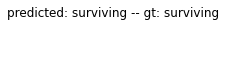

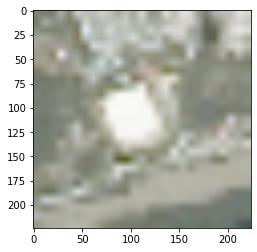

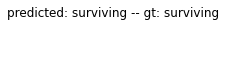

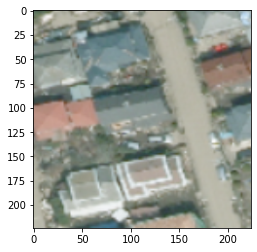

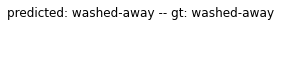

...

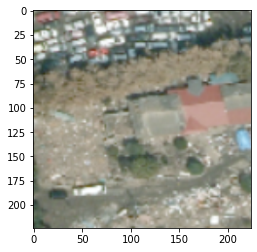

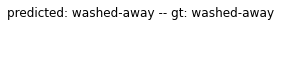

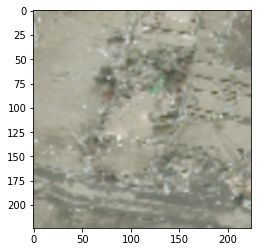

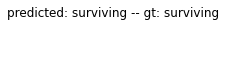

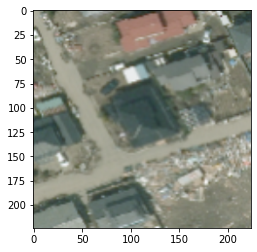

In [ ]:
visualize_model(net,10,4)

In [ ]:
# ======================
# Class-specific accuracy
# ======================

class_correct = list(0. for i in range(6))
class_total = list(0. for i in range(6))
with torch.no_grad():
    for data in dataloaders['val']:
        #images, labels = data
        images, labels = data[0].to(device), data[1].to(device)
        outputs = net(images)
        _, predicted = torch.max(outputs, 1)
        c = (predicted == labels).squeeze()
        for i in range(labels.shape[0]):
            label = labels[i]
            class_correct[label] += c[i].item()
            class_total[label] += 1

for i in range(2):
    print('Accuracy of %5s : %.2f %%' % (
        class_names[i], 100 * class_correct[i] / class_total[i]))

Accuracy of surviving : 94.74 %
Accuracy of washed-away : 94.66 %


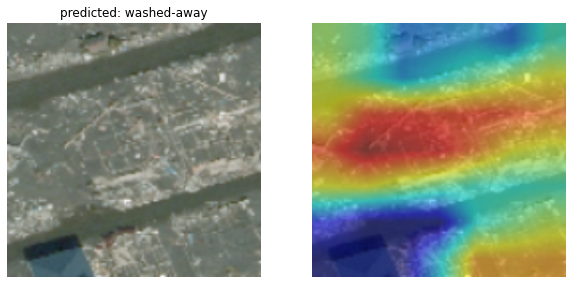

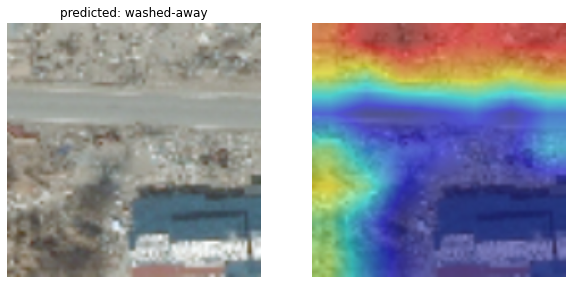

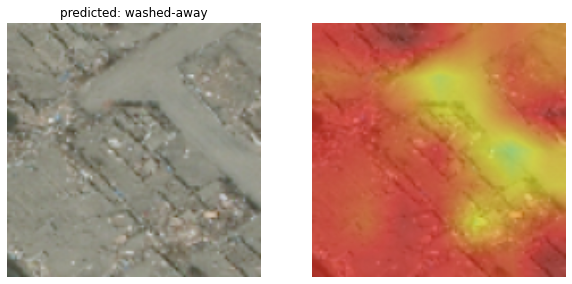

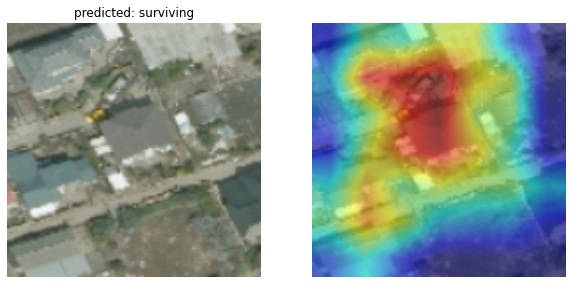

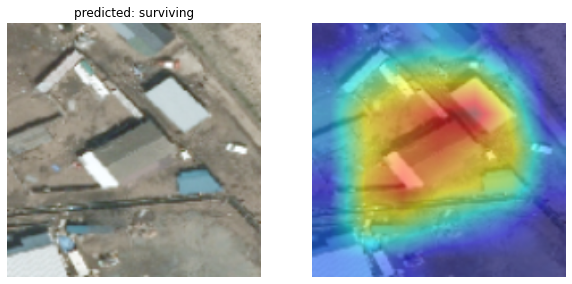

...

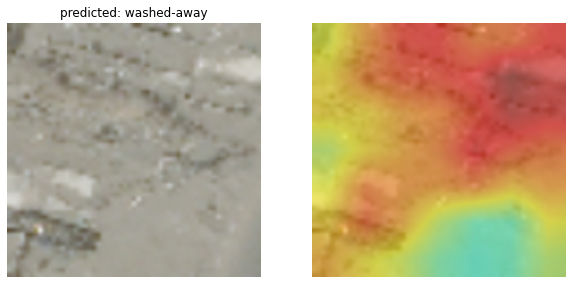

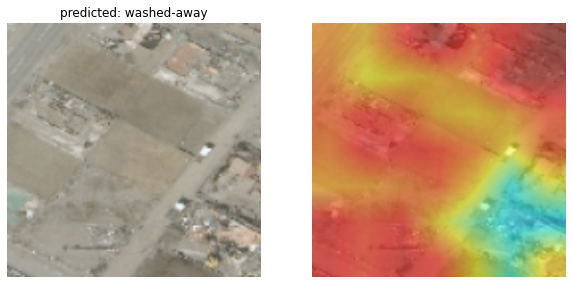

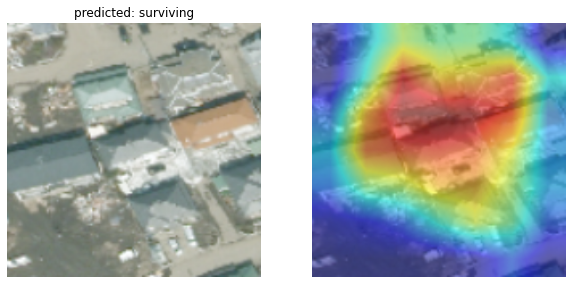

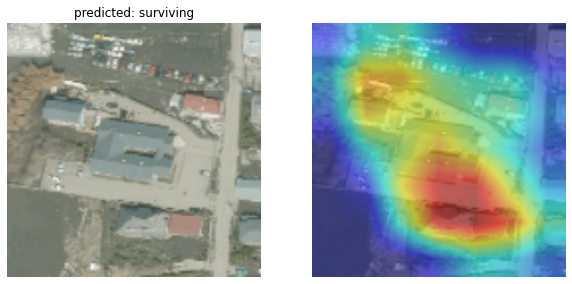

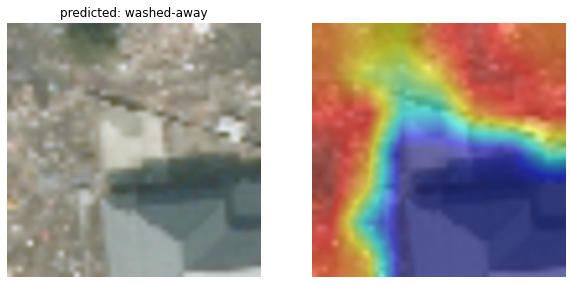

In [ ]:
# ======================
# Visualizing heatmaps of class activation
# ======================

data = next(iter(dataloaders['val']))
images, labels = data[0].to(device), data[1].to(device)

for j in range(images.size()[0]):
  image = images[j]

  feature_conv = net.features
  classifier = net.classifier

  feature_conv = feature_conv.eval()
  classifier = classifier.eval()
  # get feature maps
  feature_conv = feature_conv(image.view(-1,3,224,224))
  feature_conv = feature_conv.clone().detach().requires_grad_(True)
  # classify 
  predicted = classifier(feature_conv.view(-1,512*7*7))
  predicted[0][torch.argmax(predicted)].backward()

  pooled_gradients = torch.mean(feature_conv.grad.view(512,7*7),1)
  feature_conv = feature_conv.view(512,7,7)

  heatmap = F.relu(torch.sum(feature_conv*pooled_gradients.view(-1,1,1),0)).cpu().detach()
  heatmap /= torch.max(heatmap)

  # make image back to RGB
  mean = torch.tensor([0.485, 0.456, 0.406]).view(3,1,1).to(device)
  std = torch.tensor([0.229, 0.224, 0.225]).view(3,1,1).to(device)
  img1 = (image*std + mean).permute(1,2,0).cpu().detach().numpy()

  # resize and convert heatmap to RGB
  heatmap = np.uint8(255 * heatmap.numpy())
  heatmap = cv2.resize(heatmap, (img1.shape[1], img1.shape[0]))
  heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
  img2 = heatmap[:,:,2::-1] / 255

  # superimposisng heatmap on the original image
  alpha = 0.5
  superimpose = img1*alpha + img2*(1-alpha)

  plt.figure(figsize=(10,10))
  ax = plt.subplot(1,2,1)
  ax.set_title('predicted: {}'.format(class_names[torch.argmax(predicted)]))
  plt.imshow((image*std + mean).permute(1,2,0).cpu().detach().numpy())
  plt.axis('off')
  plt.subplot(1,2,2)
  plt.imshow(superimpose)
  plt.axis('off')
  plt.show()